<a href="https://colab.research.google.com/github/descobar7/DFWorkshop2022/blob/main/Audio_Data_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 00 LOAD GDRIVE

In [1]:
#@markdown #**Utilizar Gdrive** 🎭
#para subir propio archivo
from google.colab import files
import os

Gdrive = False #@param {type:"boolean"}

if Gdrive:
  from google.colab import drive
  drive.mount('/content/drive')


# 01 SET UP

In [ ]:
import os
import librosa
import librosa.display
import IPython.display as ipd
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [ ]:
%%capture
!pip install kaleido
!pip install plotly>=4.0.0
!wget https://github.com/plotly/orca/releases/download/v1.2.1/orca-1.2.1-x86_64.AppImage -O /usr/local/bin/orca
!chmod +x /usr/local/bin/orca
!apt-get install xvfb libgtk2.0-0 libgconf-2-4

!pip install pytube
!pip install pydub
!pip install umap-learn



In [ ]:
import pytube
from pydub import AudioSegment
import time
import matplotlib.pyplot as plt
import kaleido

from matplotlib.pyplot import specgram
%matplotlib inline
plt.style.use('ggplot')


def downloadaudio(link, soundspath):
  video = pytube.YouTube(link)
  length = video.length
  print(length, video.title)
  audio = video.streams.filter(only_audio=True, file_extension="mp4")[1]

  filename = audio.default_filename
  pathloc = os.path.join(soundspath, filename)
  exist = os.path.exists(pathloc)
  name = filename.split(".")[0]
  if os.path.exists(pathloc):
    print(f"{pathloc} exists")
  else:
    print(f"downloading...")
    audio.download(soundspath)
  return pathloc,name
  
def get_links(youtubelinks, audios_dict,soundspath):
  #getting links from youtube
  """
  linkslist = youtubelinks.split(",")
  links = [i.strip() for i in linkslist]
  print(links)
  """
  for link in youtubelinks:
    print(link)
    time.sleep(2)
    pathloc,name = downloadaudio(link, soundspath)
    audios_dict[name]={"name":name,"path":pathloc}

  return audios_dict

### Define helper functions ###
def load_sound_files(audios_dict):
    raw_sounds = []
    for k in audios_dict.keys():
        fp = audios_dict[k]['path']
        X,sr = librosa.load(fp)
        raw_sounds.append(X)
        audios_dict[k].update({"raw_sound": X})
        FRAME_SIZE = 2048
        HOP_SIZE = 512
        S_scale = librosa.stft(X, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
        Y_scale = np.abs(S_scale) ** 2
        Y_log_scale = librosa.power_to_db(Y_scale)
        audios_dict[k].update({"spectrogram_sound": Y_log_scale})
    return audios_dict

def plot_waves(audios_dict, guardar):
    i = 0
    fig = plt.figure(figsize=(25,60))
    for k in audios_dict.keys():
        n = audios_dict[k]['name']
        raw_sound = audios_dict[k]["raw_sound"]
    
        plt.subplot(10,1,i+1)
        librosa.display.waveplot(np.array(raw_sound),sr=22050)
        title = f"index: {i} , {n.title()}"
        plt.title(title)
        i += 1
    plt.suptitle('Figure 1: Waveplot',x=0.5, y=0.915,fontsize=18)
    plt.show()

    if guardar:
      fname = f"All_soundwaves.png"
      chartpath = os.path.join(imagespath,fname)
      fig.savefig(chartpath, bbox_inches='tight')
      

def plot_specgram(audios_dict):
    i = 1
    fig = plt.figure(figsize=(25,60))
    for k in audios_dict.keys():
        n = audios_dict[k]['name']
        raw_sound = audios_dict[k]["raw_sound"]
        plt.subplot(10,1,i)
        specgram(np.array(raw_sound), Fs=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 2: Spectrogram',x=0.5, y=0.915,fontsize=18)
    plt.show()

def plot_log_power_specgram(audios_dict, guardar):
    i = 0
    fig = plt.figure(figsize=(25,60))
    for k in audios_dict.keys():
        n = audios_dict[k]['name']
        raw_sound = audios_dict[k]["raw_sound"]
        plt.subplot(10,1,i+1)
        D = audios_dict[k]["spectrogram_sound"]
        librosa.display.specshow(D,x_axis='time' ,y_axis='log')
        title = f"index: {i} , {n.title()}"
        plt.title(title)
        i += 1
    plt.suptitle('Figure 2: Log power spectrogram',x=0.5, y=0.915,fontsize=18)
    plt.show()
    if guardar:
      fname = f"All_Spectrograms.png"
      chartpath = os.path.join(imagespath,fname)
      fig.savefig(chartpath, bbox_inches='tight')

def extract_feature(file_name):
    X, sample_rate = librosa.load(file_name)
    stft = np.abs(librosa.stft(X))
    mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T,axis=0)
    chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)
    mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
    contrast = np.mean(librosa.feature.spectral_contrast(S=stft,
    	sr=sample_rate).T,axis=0)
    tonnetz = np.mean(librosa.feature.tonnetz(y=librosa.effects.harmonic(X),
    	sr=sample_rate).T,axis=0)
    return mfccs,chroma,mel,contrast,tonnetz

def parse_audio_files(parent_dir,sub_dir,file_ext='*.wav'):
    features, labels = np.empty((0,193)), np.empty(0) # 193 => total features
    for fn in glob.glob(os.path.join(parent_dir, sub_dir, file_ext)):
        mfccs, chroma, mel, contrast,tonnetz = extract_feature(fn)
        ext_features = np.hstack([mfccs,chroma,mel,contrast,tonnetz])
        features = np.vstack([features,ext_features])
        labels = np.append(labels, int(fn.split('/')[2].split('-')[1]))
    return np.array(features, dtype=np.float32), np.array(labels, dtype = np.int8)

"""
sound intensity with respect to frequency and time
lower values brighter color ()
higher values darker color (high frequency)
"""

#plot_log_power_specgram(audio_dict)

'\nsound intensity with respect to frequency and time\nlower values brighter color ()\nhigher values darker color (high frequency)\n'

In [ ]:
import os

if not os.path.exists("images"):
    os.mkdir("images")

if not os.path.exists("sounds"):
    os.mkdir("sounds")

if not os.path.exists("data"):
    os.mkdir("data")

if not os.path.exists("gyroscope"):
    os.mkdir("gyroscope")

root = "/content/"

soundspath = os.path.join(root,"sounds")
imagespath = os.path.join(root,"images")
datapath = os.path.join(root,"data")
gyroscopepath = os.path.join(root,"gyroscope")
print(soundspath, imagespath,datapath,gyroscopepath )

/content/sounds /content/images /content/data /content/gyroscope


# 02 GETTING AUDIO

In [ ]:
#@markdown #**Subir Audios** 🎭
#para subir propio archivo
from google.colab import files
import os
import shutil
from collections import defaultdict,OrderedDict

upload = True #@param {type:"boolean"}

youtube = True #@param {type:"boolean"}

audio_dict = OrderedDict()

if upload:
 
  from google.colab import files
  import os

  uploaded = files.upload()

  loadedlinks = []

  for fn in uploaded.keys():
    print('User uploaded file "{name}" with length {length} bytes'.format(
        name=fn, length=len(uploaded[fn])))
    pathloc = os.path.join(soundspath, fn)
    loadedlinks.append(pathloc)
    
    shutil.copy(fn,soundspath)
    os.remove(fn)

  if len(loadedlinks) > 0:
    name = os.path.basename(loadedlinks[0]).split(".")[0]
    pathloc = loadedlinks[0]
    print(os.path.basename(loadedlinks[0]))

    audio_dict[name] = {"name":name,"path":pathloc}

if youtube:
  youtube_link_1 = "https://www.youtube.com/watch?v=Gus4dnQuiGk" #@param {type:"string"}
  youtube_link_2 = "https://www.youtube.com/watch?v=BV7RkEL6oRc" #@param {type:"string"}
  youtube_link_3 = "https://www.youtube.com/watch?v=H1Dvg2MxQn8" #@param {type:"string"}
  youtube_link_4 = "https://www.youtube.com/watch?v=K8R7zjJMIfU" #@param {type:"string"}

  youtubelinks = [youtube_link_1,youtube_link_2,youtube_link_3,youtube_link_4]
  audio_dict = get_links(youtubelinks,audio_dict,soundspath)
print("##########downloaded files#####################")
try:
  for i,k in enumerate(audio_dict.keys()):
    print(f"index {i} : {k}")
except:
  print("Mira que si allas anadido los links!!!")

audio_dict = load_sound_files(audio_dict)

Saving joseaudio.mpeg to joseaudio.mpeg
User uploaded file "joseaudio.mpeg" with length 2405271 bytes
joseaudio.mpeg
https://www.youtube.com/watch?v=Gus4dnQuiGk
363 Chopin - Fantaisie-Impromptu (Op. 66)
downloading...
https://www.youtube.com/watch?v=BV7RkEL6oRc
455 Beethoven - Moonlight Sonata (3rd Movement)
downloading...
https://www.youtube.com/watch?v=H1Dvg2MxQn8
317 Liszt - La Campanella (100,000 special)
downloading...
https://www.youtube.com/watch?v=K8R7zjJMIfU
444 Since I've Been Lovin' You - Led Zeppelin HQ (with lyrics)
downloading...
##########downloaded files#####################
index 0 : joseaudio
index 1 : Chopin - Fantaisie-Impromptu (Op 66)
index 2 : Beethoven - Moonlight Sonata (3rd Movement)
index 3 : Liszt - La Campanella (100000 special)
index 4 : Since Ive Been Lovin You - Led Zeppelin HQ (with lyrics)


/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


# 03 VISUALIZE DATA

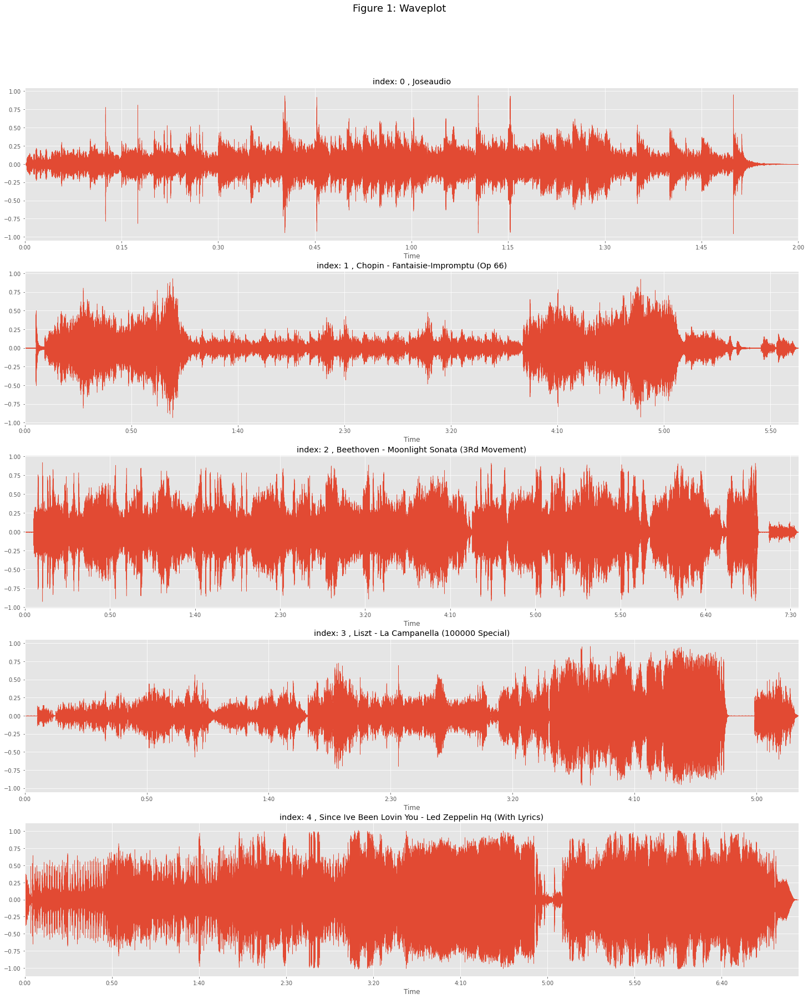

In [ ]:
#@markdown #**Visualizar Audio Wave** 🎭
#para subir propio archivo
guardar_chart = True #@param {type:"boolean"}

#plotted waveform
"""
1. frequency
2. intensity
"""

plot_waves(audio_dict, guardar_chart)


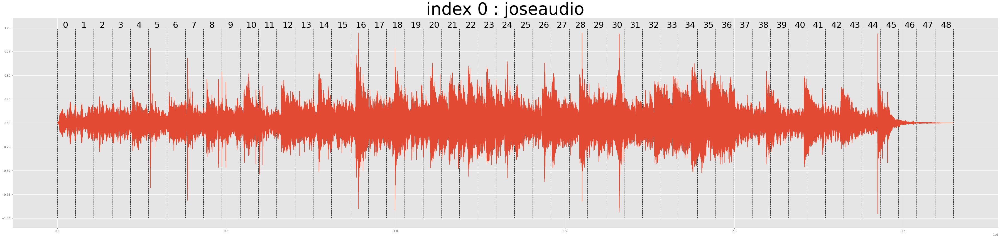

In [ ]:
#@markdown #**Seleccionar Audio por Index** 🎭
#para subir propio archivo


key = 0 #@param {type:"integer"}
divisiones = 50 #@param {type:"integer"}
guardar_chart = True #@param {type:"boolean"}

keys = list(audio_dict.keys())
#print(f"index {key} : {keys[key]}")

piece = audio_dict[keys[key]]["raw_sound"]
xx = np.arange(len(piece))
#print(piece.shape)
parts = np.linspace(start=0, stop=len(piece), num=divisiones).astype(int)

areas = []
centers = []
numberslabel = []
for i, p in enumerate(parts):
  try:
    start = parts[i]
    end = parts[i+1]
    area = piece[start:end]
    center = (end - start) // 2
    centers.append(start + center)
    areas.append(area)
    numberslabel.append(i)
  except:
    continue

fig = plt.figure(figsize=(50,12))

plt.plot(piece)
plt.vlines(parts, ymin=-1, ymax=1, linestyles='dashed')

for i,c in enumerate(centers):
  #print(c)
  plt.text(c-10000, 1, str(i), fontsize=30)
plt.title(f"index {key} : {keys[key]}",fontsize=60)
plt.tight_layout()
plt.show();

if guardar_chart:
  fname = f"index_{key}_rawsound.png"
  chartpath = os.path.join(imagespath,fname)
  fig.savefig(chartpath)


In [ ]:
#@markdown #**Interactive Display ** 🎭
#@markdown #**Seleccionar Parte de Audio por Index Key ** 🎭
#para subir propio archivo


window= 5 #@param {type:"integer"}
numero_de_puntos = 1000 #@param {type:"integer"}
guardar_chart = True #@param {type:"boolean"}
exportar_puntos = True #@param {type:"boolean"}


lowresindex = np.linspace(start=0, stop=len(areas[window])-1, num=numero_de_puntos).astype(int)
lowres = areas[window][lowresindex]


#fig = plt.figure(figsize=(25,7))

from plotly.offline import iplot
import plotly.graph_objs as go

totalpoints = len(lowres) 
xx = np.arange(len(lowres))
# Create traces
fig = go.Figure()
fig.add_trace(go.Scatter(x=xx, y=lowres,
                    mode='lines',
                    name='lines'))

annotations = []
# Title
annotations.append(dict(xref='paper', yref='paper', x=0.0, y=1.05,
                              xanchor='left', yanchor='bottom',
                              text=f"index: {key} , {keys[key]} , WINDOW: {window} , TOTAL POINTS: {totalpoints}",
                              font=dict(family='Arial',
                                        size=20,
                                        color='rgb(37,37,37)'),
                              showarrow=False))

fig.update_layout(annotations=annotations)

fig.show()
if guardar_chart:
  fname = f"index_{key}_{window}_{totalpoints}_waves.png"
  chartpath = os.path.join(imagespath,fname)

  fig.write_image(chartpath,engine="kaleido")

if exportar_puntos:
  piecedf = pd.DataFrame(lowres)
  fullpath = os.path.join(datapath, f"index_{key}_{window}_{totalpoints}_waves.csv")
  piecedf.to_csv(fullpath)

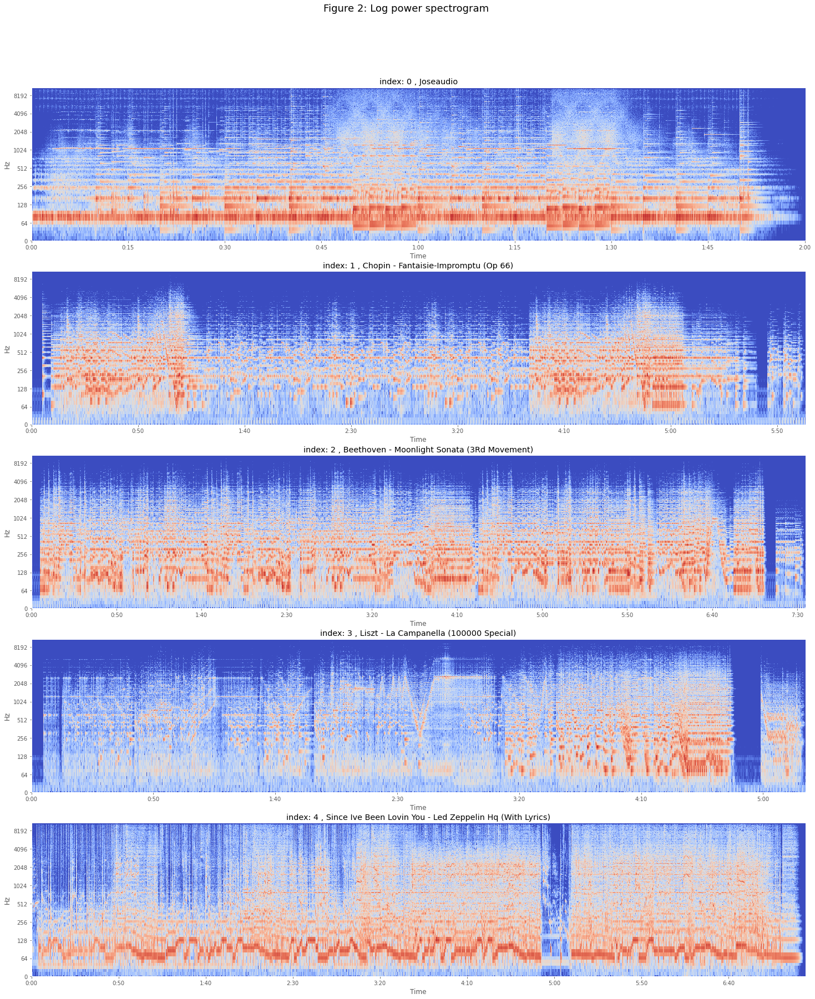

In [ ]:
#@markdown #**Visualizar Spectrogram de sonidos ** 🎭
#para subir propio archivo
guardar_chart = True #@param {type:"boolean"}
"""
sound intensity with respect to frequency and time
lower values brighter color ()
higher values darker color (high frequency)
"""

plot_log_power_specgram(audio_dict, guardar_chart)

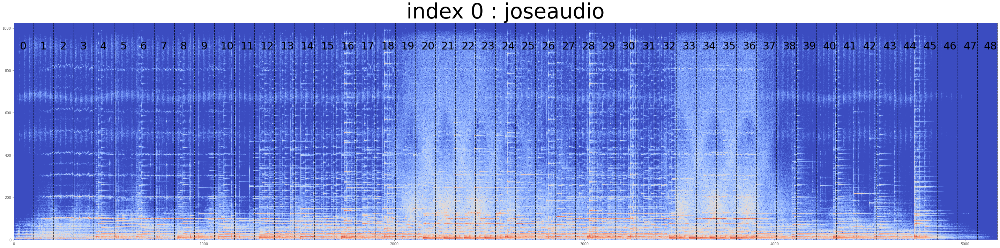

In [ ]:
#@markdown #**Seleccionar Audio por Index** 🎭
#para subir propio archivo


key = 0 #@param {type:"integer"}
divisiones = 50 #@param {type:"integer"}
guardar_chart = True #@param {type:"boolean"}


keys = list(audio_dict.keys())
#print(f"index {key} : {keys[key]}")
piece = audio_dict[keys[key]]["spectrogram_sound"]
xx = np.arange(len(piece))
parts = np.linspace(start=0, stop=piece.shape[1], num=divisiones).astype(int)

areas = []
centers = []
numberslabel = []
for i, p in enumerate(parts):
  try:
    start = parts[i]
    end = parts[i+1]
    area = piece[:,start:end]
    center = (end - start) // 2
    centers.append(start + center)
    areas.append(area)
    numberslabel.append(i)
  except:
    continue

fig = plt.figure(figsize=(40,10))
plt.pcolormesh(piece, cmap='coolwarm')
plt.vlines(parts, ymin=0, ymax=1025, linestyles='dashed')


for i,c in enumerate(centers):
  #print(c)
  plt.text(c-20, 900, str(i), fontsize=30)
plt.title(f"index {key} : {keys[key]}",fontsize=60)
plt.tight_layout()
plt.show()

if guardar_chart:
  fname = f"index_{key}_spectrogram.png"
  chartpath = os.path.join(imagespath,fname)
  fig.savefig(chartpath)

In [ ]:
#@markdown #**Interactive Display ** 🎭

#@markdown #**Mappear Features de Spectrogram a 3 dimensiones ** 🎭

window = 5 #@param {type:"integer"}
width = 900 #@param {type:"integer"}
height = 900 #@param {type:"integer"}
guardar_chart = True #@param {type:"boolean"}
exportar_puntos = True #@param {type:"boolean"}



lowres = areas[window]

totalpoints = lowres.shape[0] * lowres.shape[1]

z_data = pd.DataFrame(lowres)

fig = go.Figure(data=[go.Surface(z=z_data.values)])
fig.update_traces(contours_z=dict(show=True, usecolormap=True,
                                  highlightcolor="limegreen", project_z=True))

title = f"index: {key} , {keys[key]} , WINDOW: {window} , TOTAL POINTS: {totalpoints}"

fig.update_layout(title=title, autosize=False,
                  scene_camera_eye=dict(x=1.87, y=0.88, z=-0.64),
                  width=width, height=height,
                  margin=dict(l=65, r=50, b=65, t=90)
)

fig.show()

if guardar_chart:
  fname = f"index_{key}_{window}_{totalpoints}_spectrogram.png"
  chartpath = os.path.join(imagespath,fname)

  fig.write_image(chartpath,engine="kaleido")

if exportar_puntos:
  fullpath = os.path.join(datapath, f"index_{key}_{window}_{totalpoints}_spectrogram.csv")
  z_data.to_csv(fullpath)

# 04 Umap Dimensionality Reduction

## umap 2d

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning:

The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.



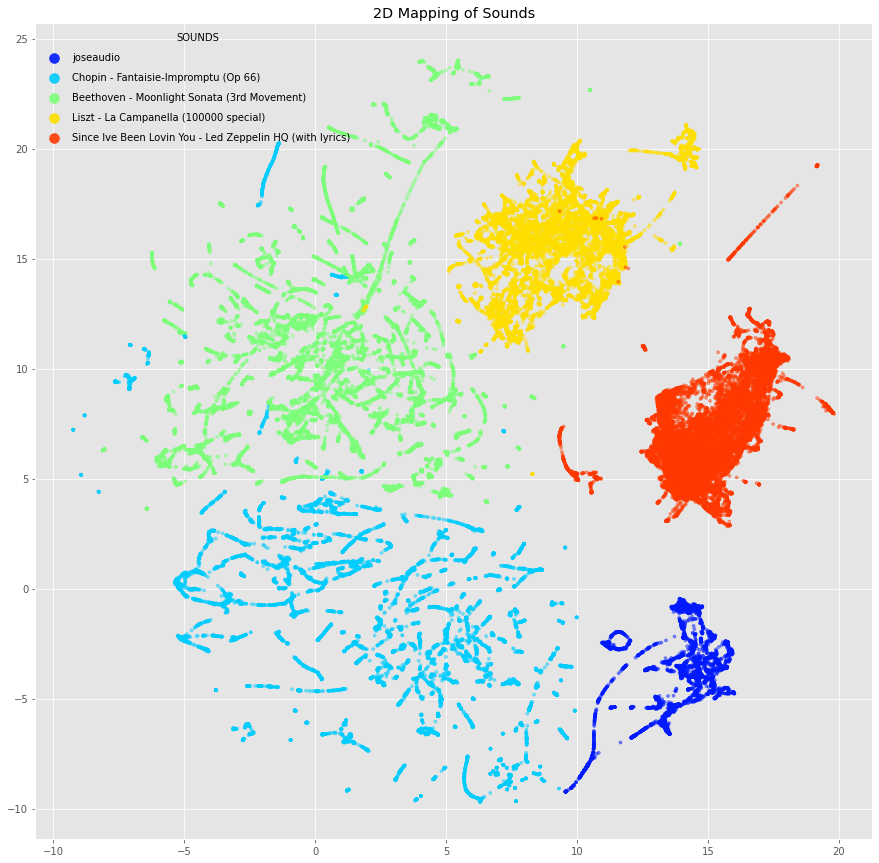

In [ ]:
#@markdown #**Mappear Features de todos sonidos a 2 dimensiones ** 🎭
#para subir propio archivo
import pandas as pd
import umap

reduce_2D = True #@param {type:"boolean"}
guardar_chart = True #@param {type:"boolean"}
exportar_puntos = True #@param {type:"boolean"}


dfs = []
count = 0
for k in audio_dict.keys():
  sr = audio_dict[k]['spectrogram_sound']
  
  df1 = pd.DataFrame(sr.T)
  name = audio_dict[k]['name'] 
  df1['label'] = count
  df1['name'] = name
  count += 1
  dfs.append(df1)
  #print(df1.shape)

stack = pd.concat(dfs, ignore_index=True, axis=0)

N = len(audio_dict.keys())
div = np.linspace(0.15, 0.85, N)
c = plt.cm.jet(div)

from sklearn import preprocessing

cdict = {}
for i in range(N):
  cdict[i] = c[i,:]
  
df= stack['label'].map(cdict)

colors = stack['label'].map(cdict)  

datatrain = stack.drop(["label","name"], axis=1)
x = datatrain.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
scaledx = pd.DataFrame(x_scaled)

labels = list(audio_dict.keys())

if reduce_2D:

  model2d = umap.UMAP(n_components=2,random_state=42).fit(scaledx)

  data2d = {"emb1": model2d.embedding_.T[0],
          "emb2": model2d.embedding_.T[1], 
          "label" : stack['label'],
          "name": stack['name']
          }
  df= pd.DataFrame(data = data2d, columns =['emb1', 'emb2','label',"name"])

  fig = plt.figure(figsize=(15,15))
  ax = fig.add_subplot(111)

  ax.scatter(df['emb1'],
            df['emb2'],
            cmap='Spectral', c = colors, s=10, alpha=.5)
  for i,k in enumerate(cdict.keys()):
      plt.scatter([], [], color=cdict[k], alpha=0.9, s=100,
                  label=labels[i])
      
  plt.legend(scatterpoints=1, frameon=False, labelspacing=1, title='SOUNDS')
  plt.title("2D Mapping of Sounds")
  plt.show()

if guardar_chart:
  fname = f"umap_2d_allsounds.png"
  chartpath = os.path.join(imagespath,fname)
  fig.savefig(chartpath)

if exportar_puntos:
  fullpath = os.path.join(datapath, "umap_2d_allsounds.csv")
  df.to_csv(fullpath)

## 3D umaps

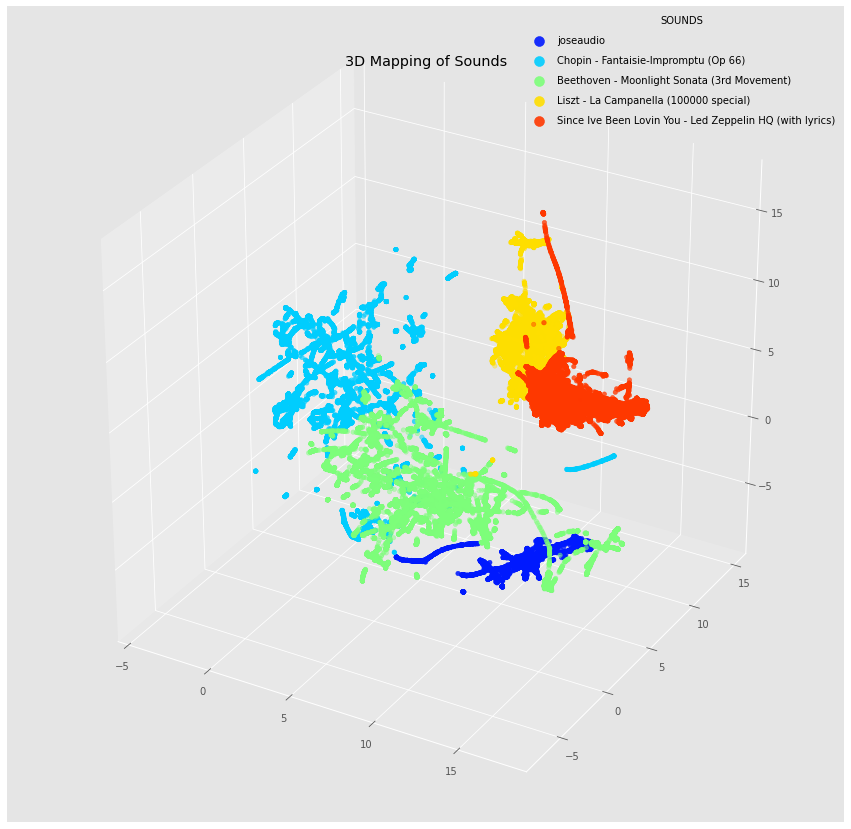

In [ ]:
#@markdown #**Mappear Features de todos sonidos a 3 dimensiones ** 🎭

reduce_3D = True #@param {type:"boolean"}

if reduce_3D:

  model3d = umap.UMAP(n_components=3,random_state=42).fit(scaledx)
  xdata, ydata, zdata = model3d.embedding_[:,0],model3d.embedding_[:,1],model3d.embedding_[:,2]
  data3d = {"emb1": xdata,
          "emb2": ydata,
          "emb3": zdata , 
          "label" : stack['label'],
          "name": stack['name']}
  df3d = pd.DataFrame(data = data3d, columns =['emb1', 'emb2',"emb3",'label', 'name'])

  from mpl_toolkits import mplot3d

  fig = plt.figure(figsize=(15,15))
  ax = plt.axes(projection='3d')

  ax.scatter3D(df3d['emb1'], df3d['emb2'],df3d['emb3'] , c = colors)

  for i,k in enumerate(cdict.keys()):
      ax.scatter([], [], color=cdict[k], alpha=0.9, s=100,
                  label=labels[i])
      
  ax.legend(scatterpoints=1, frameon=False, labelspacing=1, title='SOUNDS')
  plt.title("3D Mapping of Sounds")

  plt.show()



In [ ]:
#@markdown #**Interactive Display ** 🎭

#@markdown #**Mappear Features de todos sonidos a 3 dimensiones ** 🎭

width = 900 #@param {type:"integer"}
height = 900 #@param {type:"integer"}
guardar_chart = True #@param {type:"boolean"}
exportar_puntos = True #@param {type:"boolean"}

import plotly.graph_objects as go
import numpy as np

totalpoints = df3d.shape[0]
fig = go.Figure(data=[go.Scatter3d(x=df3d['emb1'], y=df3d['emb2'], z=df3d['emb3'],
                                   mode='markers',
                                   text= df3d['name'],
                                   marker=dict(
                                    size=2,
                                    color=df3d['label'],                # set color to an array/list of desired values
                                    #colorscale='Viridis',   # choose a colorscale
                                    opacity=0.8, 
                                ))])

title = f"3D mapping of Sounds, TOTAL POINTS: {totalpoints}"
# tight layout
"""
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.update_layout(title=title,height=height, width=width)
fig.show()
"""
fig.update_layout(title=title, autosize=False,
                  scene_camera_eye=dict(x=1.87, y=0.88, z=-0.64),
                  width=width, height=height,
                  margin=dict(l=65, r=50, b=65, t=90)
)

fig.show()
if guardar_chart:
  fname = f"umap_3d_allsounds.png"
  chartpath = os.path.join(imagespath,fname)

  fig.write_image(chartpath,engine="kaleido")

if exportar_puntos:
  fullpath = os.path.join(datapath,"umap_3d_allsounds.csv")
  df3d.to_csv(fullpath)


# 05_ Download folders

In [ ]:
#@markdown #**Descargar zip files de images y data ** 🎭

import shutil
shutil.make_archive("/content/images", 'zip', 'images')
shutil.make_archive("/content/data", 'zip', 'data')

from google.colab import files
files.download("/content/images.zip")

files.download("/content/data.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>